In [599]:
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt 
import seaborn as sns 
import My_preprocessing as mp

In [600]:
df=pd.read_csv(r"C:\Users\moham_oqbpsoe\Downloads\fitness_dataset.csv")
df

,age,height_cm,weight_kg,heart_rate,blood_pressure,sleep_hours,nutrition_quality,activity_index,smokes,gender,is_fit
0,56,152,65,69.6,117.0,NaN,2.37,3.97,no,F,1
1,69,186,95,60.8,114.8,7.5,8.77,3.19,0,F,1
2,46,192,103,61.4,116.4,NaN,8.20,2.03,0,F,0
3,32,189,83,60.2,130.1,7.0,6.18,3.68,0,M,1
4,60,175,99,58.1,115.8,8.0,9.95,4.83,yes,F,1
...,...,...,...,...,...,...,...,...,...,...,...
1995,52,173,98,60.7,106.1,NaN,1.54,3.25,1,M,1
1996,61,186,74,51.4,123.8,9.4,8.63,3.15,no,M,1
1997,77,198,89,76.7,103.6,8.3,1.98,3.36,yes,M,0
1998,62,190,63,80.7,115.9,6.7,9.21,2.39,1,F,0


In [601]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 11 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   age                2000 non-null   int64  
 1   height_cm          2000 non-null   int64  
 2   weight_kg          2000 non-null   int64  
 3   heart_rate         2000 non-null   float64
 4   blood_pressure     2000 non-null   float64
 5   sleep_hours        1840 non-null   float64
 6   nutrition_quality  2000 non-null   float64
 7   activity_index     2000 non-null   float64
 8   smokes             2000 non-null   object 
 9   gender             2000 non-null   object 
 10  is_fit             2000 non-null   int64  
dtypes: float64(5), int64(4), object(2)
memory usage: 172.0+ KB


In [602]:
df.describe()

,age,height_cm,weight_kg,heart_rate,blood_pressure,sleep_hours,nutrition_quality,activity_index,is_fit
count,2000.000000,2000.00000,2000.000000,2000.000000,2000.000000,1840.000000,2000.000000,2000.000000,2000.000000
mean,49.114000,174.53300,83.540500,70.288600,119.908850,7.513315,5.035140,2.999040,0.399500
std,17.926564,14.37175,25.852534,11.846339,14.578032,1.502031,2.864156,1.136383,0.489918
min,18.000000,150.00000,30.000000,45.000000,90.000000,4.000000,0.000000,1.000000,0.000000
25%,34.000000,162.00000,64.000000,62.100000,109.700000,6.500000,2.547500,2.037500,0.000000
50%,49.000000,174.00000,83.000000,70.250000,120.000000,7.500000,5.065000,2.980000,0.000000
75%,65.000000,187.00000,102.000000,78.425000,129.800000,8.600000,7.470000,3.950000,1.000000
max,79.000000,199.00000,250.000000,118.600000,171.200000,12.000000,10.000000,4.990000,1.000000


In [603]:
df.columns

Index(['age', 'height_cm', 'weight_kg', 'heart_rate', 'blood_pressure',
       'sleep_hours', 'nutrition_quality', 'activity_index', 'smokes',
       'gender', 'is_fit'],
      dtype='object')

# 1. Missing Values

In [604]:
df.isnull().sum()

age                    0
height_cm              0
weight_kg              0
heart_rate             0
blood_pressure         0
sleep_hours          160
nutrition_quality      0
activity_index         0
smokes                 0
gender                 0
is_fit                 0
dtype: int64

In [605]:
df.dropna(inplace=True)

# 2.Duplicate Records

In [606]:
df.duplicated().sum()

np.int64(0)

# 4. Outliers

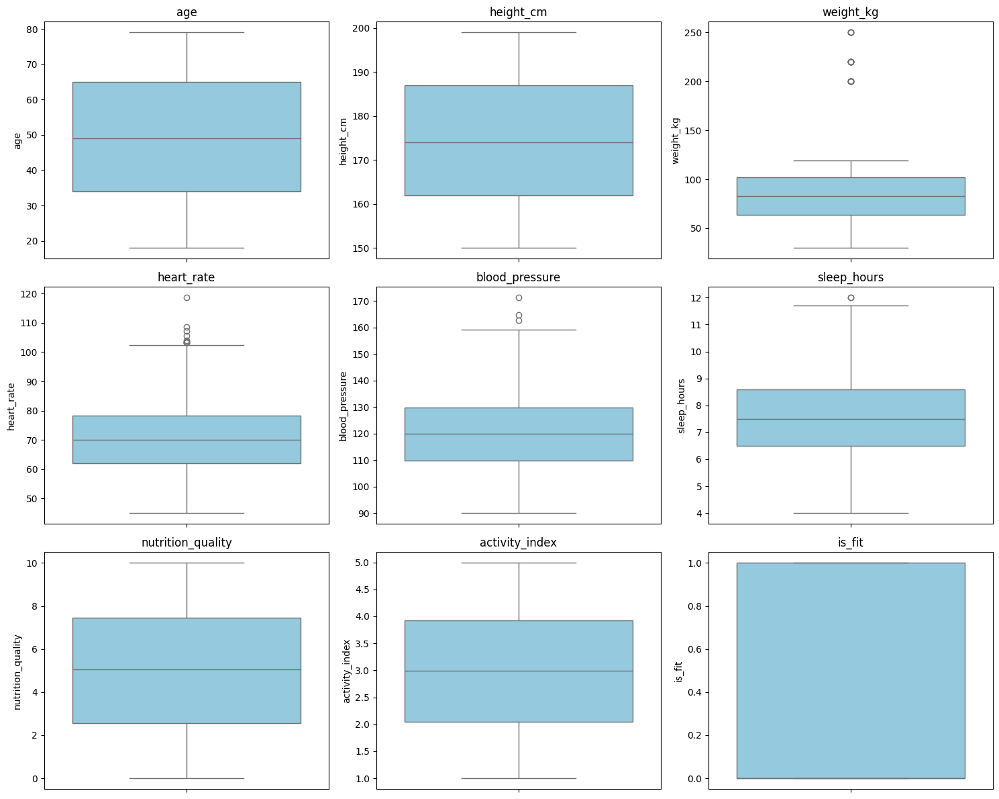

In [607]:
mp.auto_boxplots(df)

In [608]:
df=mp.handle_outliers(df,method='remove')

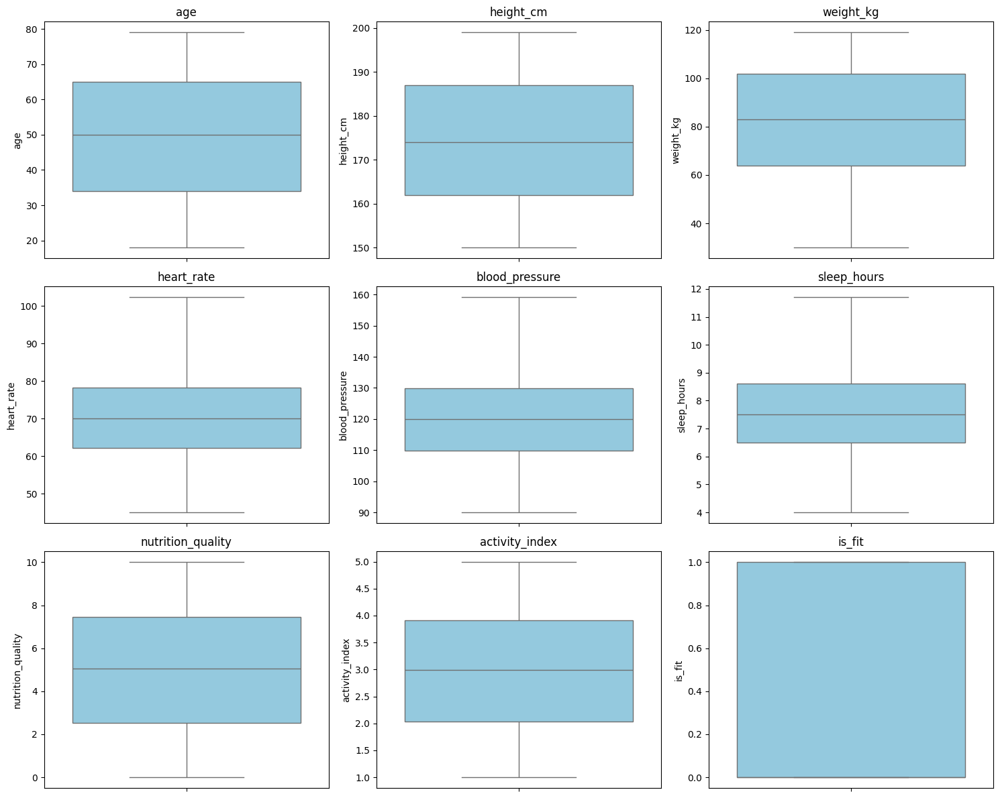

In [609]:
mp.auto_boxplots(df)

In [610]:
df['gender'] = df['gender'].map({'M':0, 'F':1})
mapping = {'no': 0, 'yes': 1, '0': 0, '1': 1}
df['smokes'] = df['smokes'].map(mapping)


# 3. Imbalanced Data


<Axes: ylabel='count'>

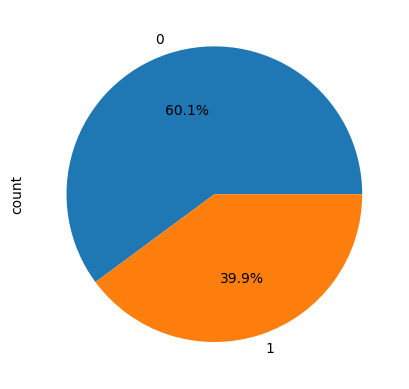

In [611]:
df['is_fit'].value_counts().plot(kind='pie',autopct='%1.1f%%')


<Axes: ylabel='count'>

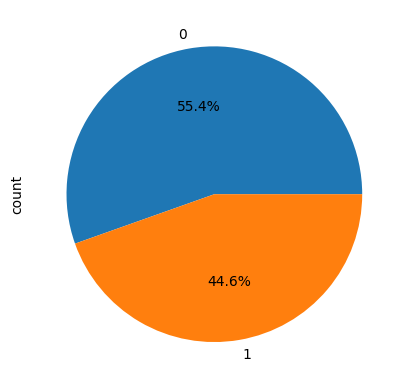

In [612]:
df['smokes'].value_counts().plot(kind='pie',autopct='%1.1f%%')


# Feature Creation (New Features)

In [613]:
df['BMI']=df['weight_kg']/ (df['height_cm'] / 100) **2
df['hr_age_ratio'] = df['heart_rate'] / df['age']


df['smoke_impact'] = df['smokes'] * df['blood_pressure']
df['BMI_x_activity'] = df['BMI'] * df['activity_index']

df['activity_hr'] = df['activity_index'] * df['heart_rate']
df['sleep_nutrition_score'] = df['sleep_hours'] * (df['nutrition_quality'] + 1)



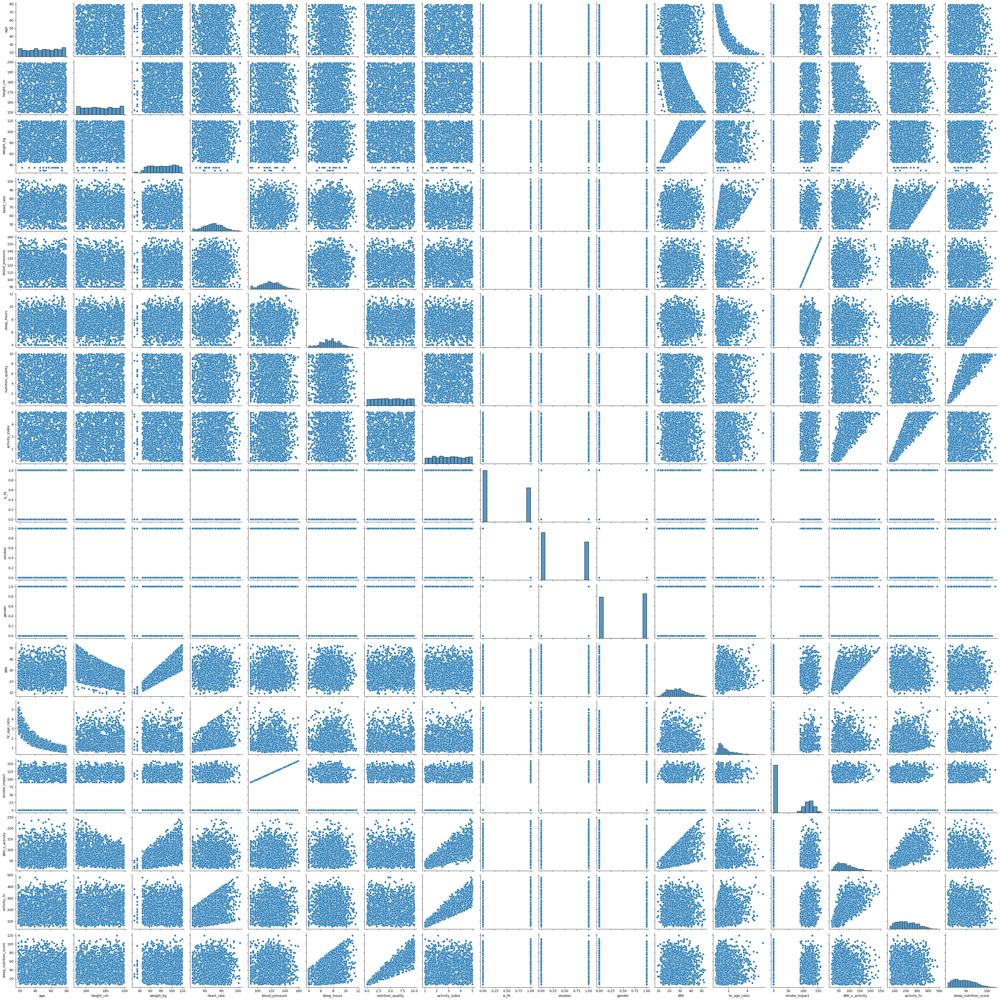

In [614]:
sns.pairplot(df)
plt.show()

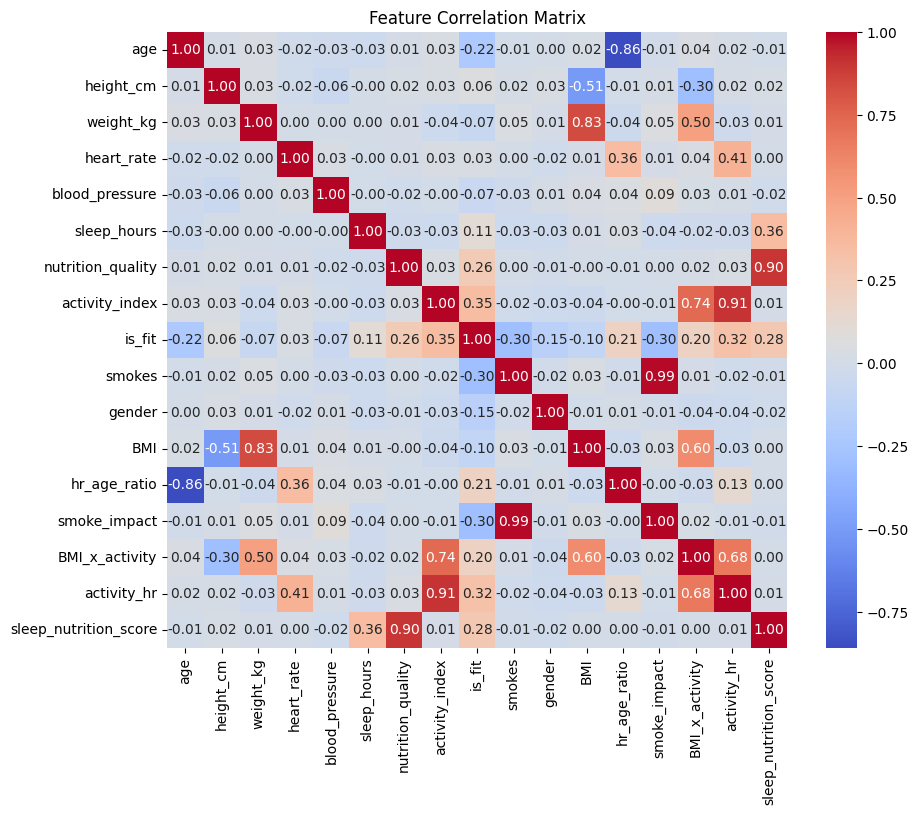

In [615]:
plt.figure(figsize=(10,8))
sns.heatmap(df.corr(), annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Feature Correlation Matrix")
plt.show()

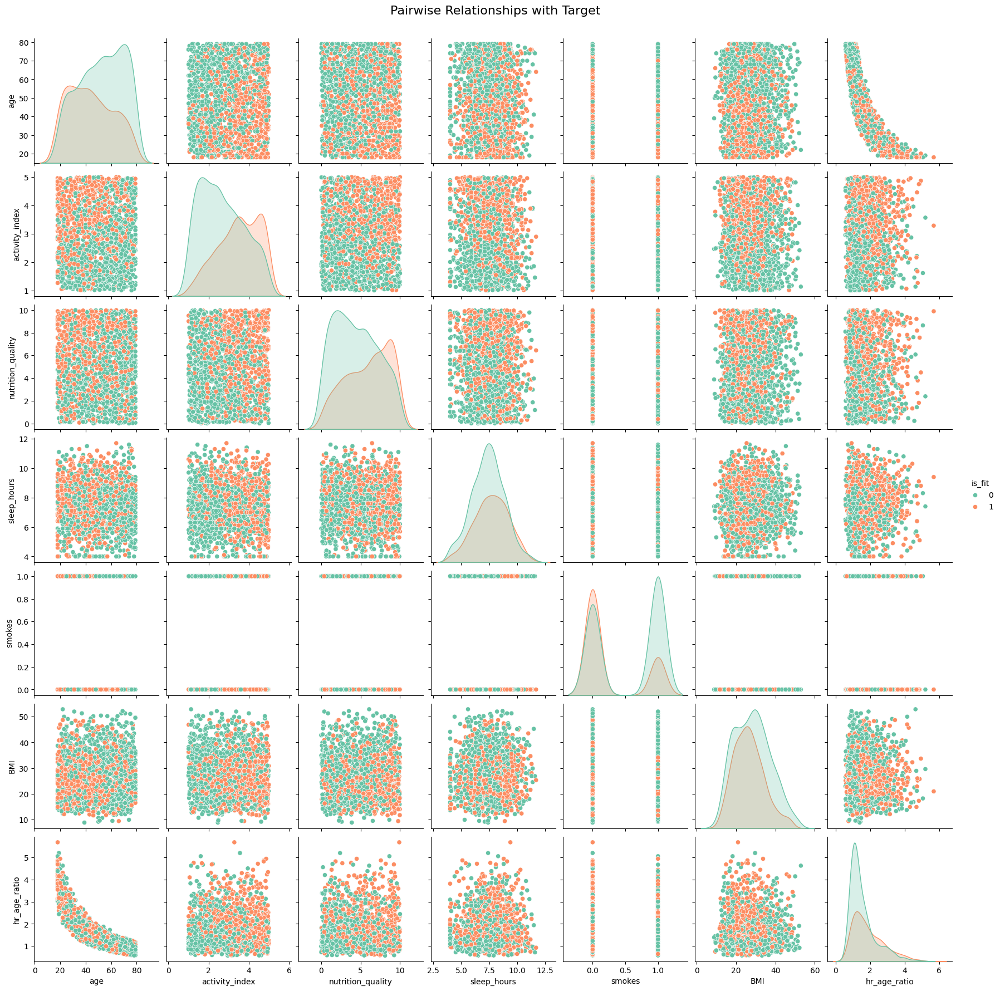

In [616]:
features = ['age', 'activity_index', 'nutrition_quality', 'sleep_hours', 'smokes', 'is_fit','BMI','hr_age_ratio']
sns.pairplot(df[features], hue='is_fit', diag_kind='kde', palette='Set2')
plt.suptitle("Pairwise Relationships with Target", y=1.02, fontsize=16)
plt.show()

Feature Importances:
 activity_index           0.126551
sleep_nutrition_score    0.092415
activity_hr              0.087359
nutrition_quality        0.082028
hr_age_ratio             0.072764
age                      0.064996
smoke_impact             0.064362
BMI                      0.062221
BMI_x_activity           0.059749
blood_pressure           0.048440
sleep_hours              0.047578
heart_rate               0.047500
weight_kg                0.045001
height_cm                0.041080
smokes                   0.039711
gender                   0.018246
dtype: float64


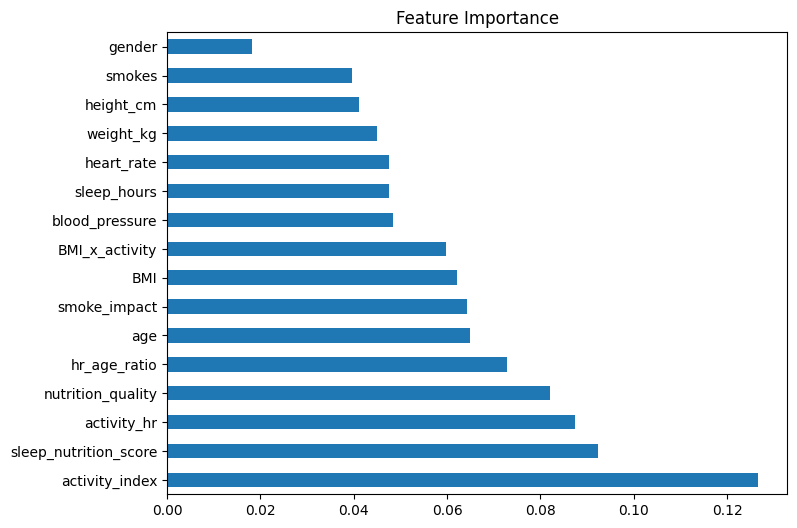

In [617]:
from sklearn.ensemble import RandomForestClassifier
X = df.drop('is_fit', axis=1)
y = df['is_fit']

rf = RandomForestClassifier(random_state=42)
rf.fit(X, y)

feat_importances = pd.Series(rf.feature_importances_, index=X.columns)
feat_importances.sort_values(ascending=False, inplace=True)
print("Feature Importances:\n", feat_importances)

# Plot feature importances
feat_importances.plot(kind='barh', figsize=(8,6))
plt.title("Feature Importance")
plt.show()

In [618]:
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression

model=LogisticRegression(max_iter=1000)

rfe=RFE(model,n_features_to_select=10)

rfe.fit(X,y)
selected_features=X.columns[rfe.get_support()]
print("RFE Selected Features:", selected_features.tolist())

c:\Users\moham_oqbpsoe\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\linear_model\_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\Users\moham_oqbpsoe\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\linear_model\_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://sci

RFE Selected Features: ['age', 'height_cm', 'weight_kg', 'blood_pressure', 'sleep_hours', 'nutrition_quality', 'activity_index', 'smokes', 'gender', 'BMI']


c:\Users\moham_oqbpsoe\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\linear_model\_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


RFE Selected Features: ['age', 'height_cm', 'weight_kg', 'blood_pressure', 'sleep_hours', 'nutrition_quality', 'activity_index', 'smokes', 'gender', 'BMI']


In [619]:
from sklearn.feature_selection import SequentialFeatureSelector
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler

model=LogisticRegression(max_iter=1000)
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)


sfs_forward=SequentialFeatureSelector(model,n_features_to_select=10,direction='forward',cv=5)
sfs_forward.fit(X_scaled,y)

selected_feature_forward=X.columns[sfs_forward.get_support()]

print("Forward Selection Features:", selected_feature_forward.tolist())


Forward Selection Features: ['age', 'sleep_hours', 'nutrition_quality', 'activity_index', 'smokes', 'gender', 'BMI', 'smoke_impact', 'activity_hr', 'sleep_nutrition_score']


In [620]:
from sklearn.feature_selection import SequentialFeatureSelector
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler

model=LogisticRegression(max_iter=1000)
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)


sfs_backward=SequentialFeatureSelector(model,n_features_to_select=10,direction='backward',cv=5)
sfs_backward.fit(X_scaled,y)

selected_feature_backward=X.columns[sfs_backward.get_support()]

print("Backward Selection Features:", selected_feature_backward.tolist())


Backward Selection Features: ['age', 'height_cm', 'weight_kg', 'blood_pressure', 'activity_index', 'smokes', 'gender', 'BMI', 'BMI_x_activity', 'sleep_nutrition_score']


In [621]:
X_selected = X[[
    'age',
    'height_cm',
    'weight_kg',
    'blood_pressure',
    'sleep_hours',
    'nutrition_quality',
    'activity_index',
    'BMI',
    'sleep_nutrition_score',
    'activity_hr',
    'smoke_impact',
    "BMI_x_activity"
]]



In [622]:
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split,GridSearchCV
from sklearn.metrics import confusion_matrix,ConfusionMatrixDisplay,classification_report,accuracy_score
from sklearn.pipeline import Pipeline

from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier ,GradientBoostingClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.decomposition import PCA



Accuracy: 0.7845303867403315


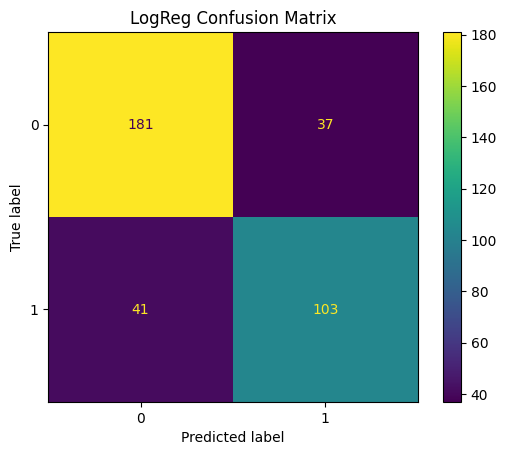

Accuracy: 0.7762430939226519


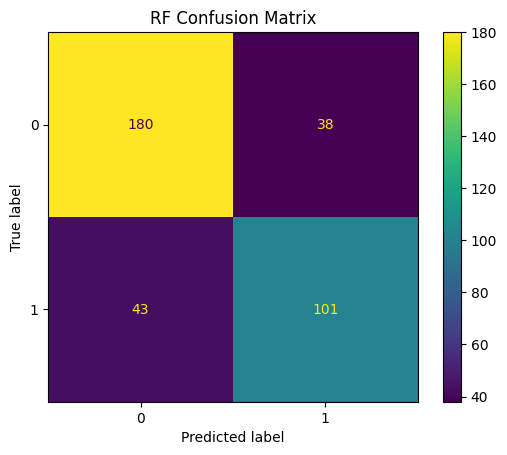

Accuracy: 0.7900552486187845


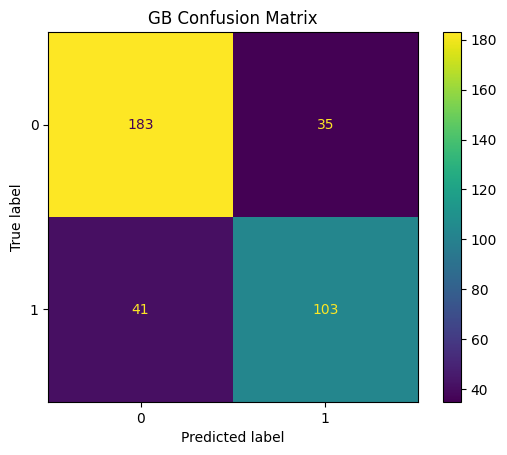

Accuracy: 0.7209944751381215


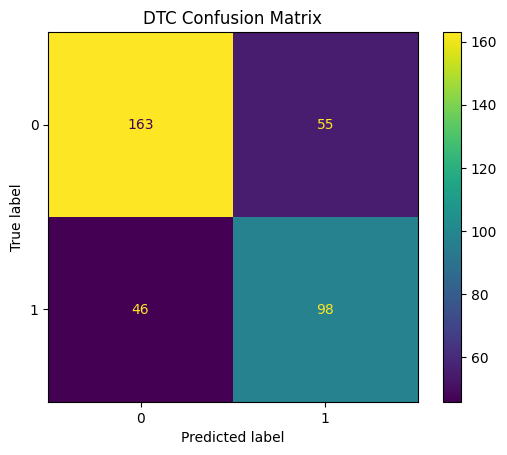

Accuracy: 0.787292817679558


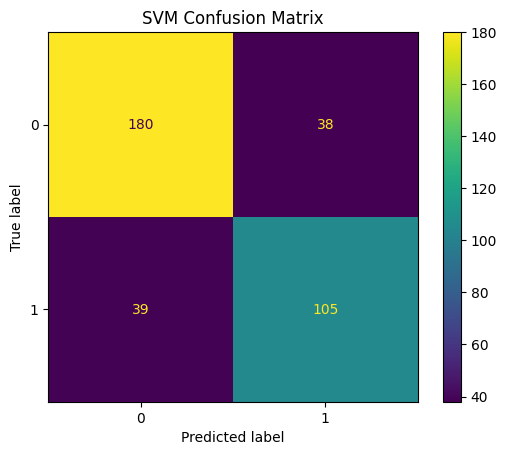

Accuracy: 0.7375690607734806


c:\Users\moham_oqbpsoe\AppData\Local\Programs\Python\Python313\Lib\site-packages\xgboost\training.py:183: UserWarning: [16:58:37] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


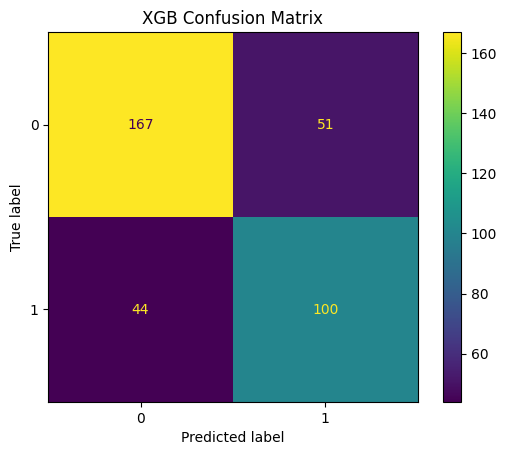

Accuracy: 0.7486187845303868


c:\Users\moham_oqbpsoe\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


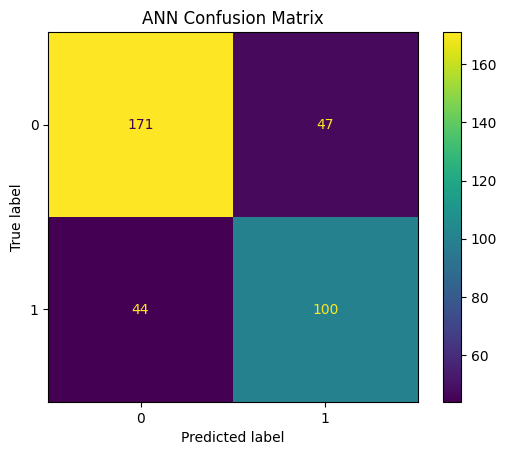

In [623]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

models = {
    'LogReg': LogisticRegression(max_iter=1000),
    'RF': RandomForestClassifier(n_estimators=200, random_state=42),
    'GB': GradientBoostingClassifier(n_estimators=200, random_state=42),
    'DTC':DecisionTreeClassifier(criterion="gini",max_depth=5,  min_samples_split=2,random_state=42),
    'SVM': SVC(probability=True, random_state=42),
    'XGB': XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42),
    'ANN': MLPClassifier(hidden_layer_sizes=(64,32), max_iter=500, random_state=42)
}
results={}

for name,model in models.items():
    pipeline=Pipeline([('scaler',StandardScaler()),('pca', PCA(n_components=0.95, random_state=42)), (f'{name}',model)])
    pipeline.fit(X_train,y_train)
    y_pred=pipeline.predict(X_test)
    accuracy=accuracy_score(y_test,y_pred)
    
    results[name]={'accuracy':accuracy}
    
    print("Accuracy:", accuracy_score(y_test, y_pred))
    
    # Confusion Matrix
    disp = ConfusionMatrixDisplay.from_predictions(y_test, y_pred)
    disp.ax_.set_title(f"{name} Confusion Matrix")
    plt.show()

In [624]:
results

{'LogReg': {'accuracy': 0.7845303867403315},
 'RF': {'accuracy': 0.7762430939226519},
 'GB': {'accuracy': 0.7900552486187845},
 'DTC': {'accuracy': 0.7209944751381215},
 'SVM': {'accuracy': 0.787292817679558},
 'XGB': {'accuracy': 0.7375690607734806},
 'ANN': {'accuracy': 0.7486187845303868}}

In [625]:
models = {
    'LogReg': LogisticRegression(max_iter=1000),
    'RF': RandomForestClassifier(random_state=42),
    'GB': GradientBoostingClassifier(random_state=42),
    'DTC':DecisionTreeClassifier(criterion="gini",max_depth=5,  min_samples_split=2,random_state=42),
    'SVM': SVC(probability=True, random_state=42),
    'XGB': XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42),
    'ANN': MLPClassifier(hidden_layer_sizes=(64,32), max_iter=500, random_state=42)
}


param_grids = {
    'LogReg': {
        'classifier__C': [0.01, 0.1, 1, 10, 50],
        'classifier__penalty': ['l2'],
        'classifier__solver': ['lbfgs', 'saga']
    },
    'RF': {
        'classifier__n_estimators': [100, 200, 500, 1000],
        'classifier__max_depth': [None, 5, 10, 20],
        'classifier__min_samples_split': [2, 5, 10],
        'classifier__min_samples_leaf': [1, 2, 4]
    },
    'GB': {
        'classifier__n_estimators': [100, 200, 500],
        'classifier__learning_rate': [0.01, 0.05, 0.1],
        'classifier__max_depth': [3, 5, 7]
    },
    'DTC': {
    'classifier__criterion': ['gini', 'entropy'],
    'classifier__max_depth': [None, 3, 5, 7, 10, 15],
    'classifier__min_samples_split': [2, 5, 10, 20],
    'classifier__min_samples_leaf': [1, 2, 4, 6]
    },
    
    'SVM': {
        'classifier__C': [0.1, 1, 10, 50],
        'classifier__kernel': ['linear', 'rbf', 'poly'],
        'classifier__gamma': ['scale', 'auto', 0.01, 0.1]
    },
    'XGB': {
        'classifier__n_estimators': [100, 200, 500],
        'classifier__learning_rate': [0.01, 0.05, 0.1],
        'classifier__max_depth': [3, 5, 7],
        'classifier__subsample': [0.7, 0.8, 1.0]
    },
    'ANN': {
        'classifier__hidden_layer_sizes': [(64,32), (128,64), (64,64,32)],
        'classifier__activation': ['relu', 'tanh'],
        'classifier__alpha': [0.0001, 0.001, 0.01],
        'classifier__learning_rate_init': [0.001, 0.01]
    }
}



best_models = {}

for name, model in models.items():
    pipeline = Pipeline([
        ('scaler', StandardScaler()),  
        ('classifier', model)
    ])
    
    grid = GridSearchCV(pipeline, param_grids[name], cv=5, scoring='accuracy', n_jobs=-1)
    grid.fit(X_train, y_train)
    
    best_models[name] = grid.best_estimator_
    
    y_pred = grid.predict(X_test)
    test_acc = accuracy_score(y_test, y_pred)
    print(f"{name} best params: {grid.best_params_}")
    print(f"{name} test accuracy: {test_acc:.4f}")
    print("-"*40)

LogReg best params: {'classifier__C': 1, 'classifier__penalty': 'l2', 'classifier__solver': 'lbfgs'}
LogReg test accuracy: 0.7928
----------------------------------------
RF best params: {'classifier__max_depth': None, 'classifier__min_samples_leaf': 2, 'classifier__min_samples_split': 10, 'classifier__n_estimators': 100}
RF test accuracy: 0.7597
----------------------------------------
GB best params: {'classifier__learning_rate': 0.01, 'classifier__max_depth': 5, 'classifier__n_estimators': 200}
GB test accuracy: 0.7514
----------------------------------------
DTC best params: {'classifier__criterion': 'entropy', 'classifier__max_depth': 7, 'classifier__min_samples_leaf': 6, 'classifier__min_samples_split': 20}
DTC test accuracy: 0.7127
----------------------------------------
SVM best params: {'classifier__C': 10, 'classifier__gamma': 'scale', 'classifier__kernel': 'linear'}
SVM test accuracy: 0.7873
----------------------------------------


c:\Users\moham_oqbpsoe\AppData\Local\Programs\Python\Python313\Lib\site-packages\xgboost\training.py:183: UserWarning: [17:06:17] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


XGB best params: {'classifier__learning_rate': 0.01, 'classifier__max_depth': 3, 'classifier__n_estimators': 500, 'classifier__subsample': 0.7}
XGB test accuracy: 0.7762
----------------------------------------
ANN best params: {'classifier__activation': 'tanh', 'classifier__alpha': 0.01, 'classifier__hidden_layer_sizes': (128, 64), 'classifier__learning_rate_init': 0.01}
ANN test accuracy: 0.7624
----------------------------------------


In [626]:
final_pipeline = Pipeline([
    ('scaler', StandardScaler()),
    # ('pca', PCA(n_components=0.95, random_state=42)),  # keep 95% variance
    ('classifier', LogisticRegression(
        C=1, penalty='l2', solver='lbfgs', max_iter=1000, random_state=42
    ))
])

# fit on train
final_pipeline.fit(X_train, y_train)

# evaluate
test_acc = final_pipeline.score(X_test, y_test)
print(f"Final LogReg Test Accuracy: {test_acc:.4f}")

Final LogReg Test Accuracy: 0.7928


In [627]:
# pca_model = final_pipeline.named_steps['pca']
# print("Original features:", X.shape[1])
# print("Reduced features after PCA:", pca_model.n_components_)
# print("Explained variance per component:", pca_model.explained_variance_ratio_)
# print("Total variance preserved:", pca_model.explained_variance_ratio_.sum())

In [628]:
import joblib

joblib.dump(final_pipeline, "final LogisticRegression_model.pkl")


['final LogisticRegression_model.pkl']